In [1]:
from oads_access.oads_access import OADS_Access
import pandas as pd
import os
from PIL import Image
from matplotlib import pyplot as plt

In [2]:
oads = OADS_Access(basedir='/home/niklas/projects/data/oads/')

In [3]:
home_dir = '/mnt/c/Users/nikla/OneDrive - UvA/OADS_Backup'
jpeg_dir = '/mnt/c/Users/nikla/OneDrive - UvA/OADS_Backup/Deidentified/JPG'

df = pd.read_csv(os.path.join(home_dir, 'manual_annotations_annette_260523.csv'))

In [4]:
df.head()

,filename,quality_ok,navigable,applicable_start_area,faces_ok,license_plates_ok,license_reservation,attention_check,correct_blur,no_duplicates,to_annotate
0,0000018494729a82,y,y,y,y,y,y,y,y,y,n
1,000002c2db39399e,y,y,y,y,y,y,y,y,y,n
2,0001515331a1c8c0,y,y,y,y,y,y,y,y,y,n
3,0002cac8c8ced0c8,y,y,y,y,y,y,y,y,y,n
4,00030323eb99c2e0,y,y,y,n,y,y,y,y,y,n


# Quality not OK

In [ ]:
n = 10

fig, ax = plt.subplots(n,2, figsize=(20,n*8))

for i in range(n):
    f = df[(df['quality_ok'] == 'n')].iloc[i].filename
    img = Image.open(os.path.join(jpeg_dir, f'{f}.JPG'))
    try:
        raw_image = oads.load_image(image_name=f)[0]
    except KeyError:
        continue
    # print(f, img.size)


    ax[i, 0].imshow(img)
    ax[i, 1].imshow(raw_image)

    ax[i, 0].set_title(f'{f} {img.size}')
    ax[i, 1].set_title(f'{f} {raw_image.size}')

    # print(f, raw_image.size)

plt.show()

# Quality OK

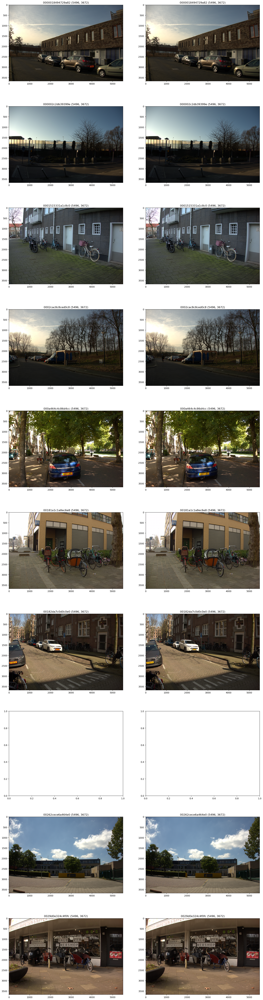

In [5]:
n = 10

fig, ax = plt.subplots(n,2, figsize=(20,n*8))
_data = df[(df['quality_ok'] == 'y') & (df['faces_ok'] == 'y') & (df['license_plates_ok'] == 'y') & (df['correct_blur'] == 'y') & (df['no_duplicates'] == 'y')]
for i in range(n):
    f = _data.iloc[i].filename
    img = Image.open(os.path.join(jpeg_dir, f'{f}.JPG'))
    try:
        raw_image = oads.load_image(image_name=f)[0]
    except KeyError:
        continue
    # print(f, img.size)


    ax[i, 0].imshow(img)
    ax[i, 1].imshow(raw_image)

    ax[i, 0].set_title(f'{f} {img.size}')
    ax[i, 1].set_title(f'{f} {raw_image.size}')

    # print(f, raw_image.size)

plt.show()

In [20]:
_data = df[(df['no_duplicates'] == 'y') & (df['quality_ok'] == 'y') & (df['correct_blur'] == 'y') & (df['faces_ok'] == 'y') & (df['license_plates_ok'] == 'y')]

In [21]:
_data.count()

filename                 1400
quality_ok               1400
navigable                1400
applicable_start_area    1400
faces_ok                 1400
license_plates_ok        1400
license_reservation      1400
attention_check          1400
correct_blur             1400
no_duplicates            1400
to_annotate              1400
dtype: int64

In [23]:
from result_manager.result_manager import ResultManager
import tqdm

result_manager = ResultManager(root='/home/niklas/projects/oads_access/generated_annotations')
# result_manager.save_result(result=license_plate_annotations_per_image, filename=f'license_plate_annotations_per_image.pkl')
# result_manager.save_result(result=face_annotations_per_image, filename=f'face_annotations_per_image.pkl')
license_plate_annotations_per_image = result_manager.load_result(filename=f'license_plate_annotations_per_image.pkl')
face_annotations_per_image = result_manager.load_result(filename=f'face_annotations_per_image.pkl')

In [27]:
for index, (image_id, list) in enumerate(license_plate_annotations_per_image.items()):
    print(image_id)

f0e0900a22ccdefe
903860c2302c21f0
1228d6aeac627038
c0c94d550d100666
6c69ebccdcd8b8b8
006262696c840cf0
93d79393db57f2f4
9907070dcc10e8d0
e06666b83280d090
fafee5e7d8dabab6
e2f0e8ccd80e1e3c
909112199b9f3d54
2cec4a88a480c0c0
9692928b8b88909c
bbbbf879697b77a7
7474d84a31b8dec9
2928240723383ab8
18aee7e3e9d2f7c8
a0a8c0d7d1c8ccc2
a63499f3f1d97873
cdcda171e588cea4
caeb6b697f9f9ec6
f2a6860666e2e3c3
bcafe34c6aa28205
9818d8218a1399b8
b1b178303931e0c9
9130327cf8fceee0
6121a1a1e5e1c3d0
30bc2e6ac58c1cb8
7979597cf9a1c3de
095999632b3993c8
323bd9d3a6a3f0f2
061c98c56ceddc98
090b656571511100
683178d830e498b4
ee666ce6d07c8eca
e7dbc70eb7e1e4f8
092eac0ee6f0ed8c
e4a4495c1870e8f0
6f6e6a4ad474cf60
90d0c284c168b0d0
53d3f3fa26262692
32b39a98d0983898
7c5c5c89e42e3aeb
fcf87262989c70e0
c8f0b4ad0dbee6f6
e46da5763edac032
e6c6c34d41848983
696a154c62707070
6a4c9c21e4e1e2f3
6e5edbdfd4c49e02
b066eedc98bafaf8
620b0b8268c30030
d6dcc6c69090c280
e8c85836cce192e0
f18bf1f1c73cf2c6
2cacb962e49cdcf0
b6a66c70f2fbeee3
3232b2ba0270e8

In [34]:
face_annotations_per_image.keys()

dict_keys(['0185c57968ccb9a2', '0204440c8783c0e4', '020ae8e93a364820', '02c20039e9425e5c', '0327262794c0c0c0', '0888c3cb092723f1', '0d8d95b1e6cacac6', '0e0c04262626f2a3', '0e1a5b73b08e6038', '0e1a5bd3308e6038', '125a425644b498a0', '13575f132fe6c2f8', '13d3f13f5dfd069e', '143045c7a5a383c2', '1617baf2c830e0d0', '1636344718dc88c0', '181a6ee734909088', '189cdce2c4ddb9da', '1939591992133830', '1939591992133838', '1948aaab864e3546', '1a22287bfb593940', '1a7a7a1a8e878683', '1ad3862038c0f0f0', '1dacf432f320068c', '1e0e2d4cd85a1ae6', '1e0ec68496964688', '1e363c3a5265909c', '202032e161deafb1', '21a175d690a9e4e2', '22ebf21f80e0f8b0', '23001292521a8c84', '23001292521aacc4', '2464b2e94b4284c7', '25a4acc9db3f6cdc', '26a6868626232323', '2838b9c58960e0c8', '2c3430b28330303c', '3032b2f4f0e8fe23', '321e5efefab6a5a7', '33626ce2e5c1c342', '3396de7370606068', '34393b3bb53770f8', '34393b3bb93b78f8', '348d9b99db6321c6', '36727264613cf6e4', '367632b3d1b2fcc0', '3717dbd3d387d5df', '37973531159d0743', '3839b28d

In [75]:
import numpy as np
import cv2
from PIL import ImageDraw

[[3908.09119669 4078.2326733  4081.55282581 3911.40971527]
 [2947.17603088 2933.93617989 2993.99035253 3007.23020352]]


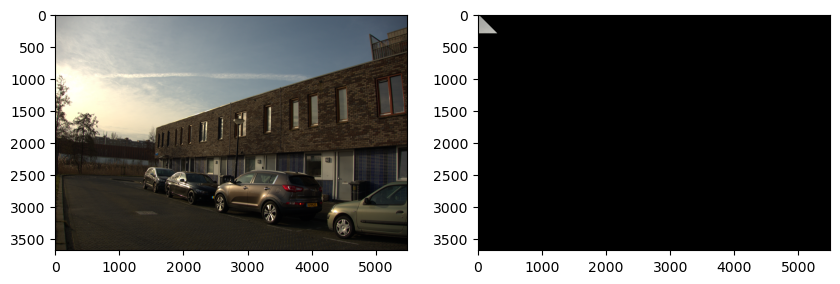

In [47]:
image_id = _data.iloc[0].filename
raw_image = oads.load_image(image_name=image_id)[0]

license_plate = license_plate_annotations_per_image[image_id]
fig, ax = plt.subplots(1,2, figsize=(10,5))
ax[0].imshow(raw_image)

masked_image = np.array(raw_image)

for box, filename in license_plate:
    print(box)
    masked_image = masked_image

ax[1].imshow(masked_image)

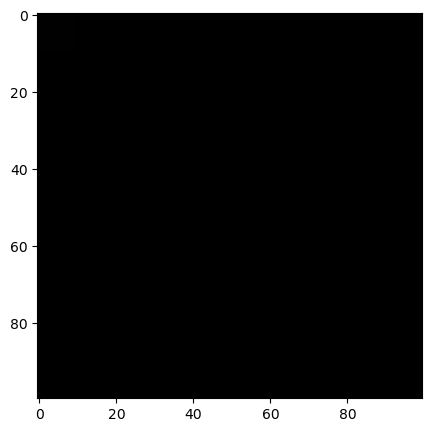

In [72]:
a = np.zeros((100, 100, 3), dtype=np.uint8)
b = np.ones((100, 100, 3), dtype=np.uint8)
mask = np.zeros((100, 100), dtype=np.uint8)
mask[:10, :10] = 1
c = cv2.bitwise_or(a,b, mask=mask)

fig, ax = plt.subplots(1,1, figsize=(10,5))
ax.imshow(c)

In [89]:
points = [(x[0], x[1]) for x in box.T]

[(3908.0911966929602, 2947.176030884256),
 (4078.2326733045606, 2933.93617989408),
 (4081.5528258108006, 2993.990352531696),
 (3911.40971526588, 3007.2302035218718)]

In [82]:
from matplotlib.path import Path

(3672, 5496)


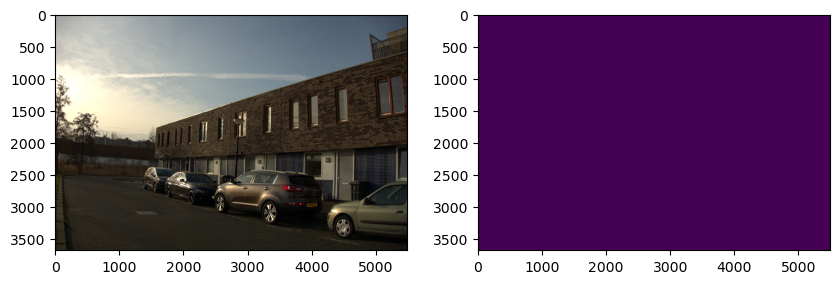

In [147]:
nx, ny, _ = np.array(raw_image).shape
x, y = np.meshgrid(np.arange(nx), np.arange(ny))
x, y = x.flatten(), y.flatten()

points = np.vstack((x,y)).T
poly_verts = [(x[0], x[1]) for x in box.T]
path = Path(poly_verts)
path = path.contains_points(points)
path = path.reshape((nx, ny))
path = np.array(path, dtype=np.uint8)
print(path.shape)

fig, ax = plt.subplots(1,2, figsize=(10,5))
ax[0].imshow(raw_image)
# ax[1].imshow(cv2.bitwise_and(np.array(raw_image), np.array(blur_image), mask=path))
ax[1].imshow(path)

In [138]:
poly_verts

[(3908.0911966929602, 2947.176030884256),
 (4078.2326733045606, 2933.93617989408),
 (4081.5528258108006, 2993.990352531696),
 (3911.40971526588, 3007.2302035218718)]

(5496, 3672)


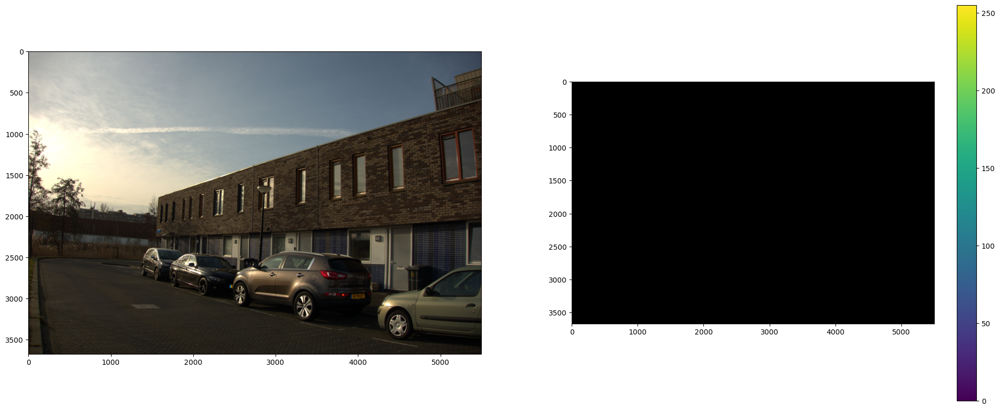

In [199]:
fig, ax = plt.subplots(1,2, figsize=(25,10))

image_id = _data.iloc[0].filename
raw_image = oads.load_image(image_name=image_id)[0]

ax[0].imshow(raw_image)

blur_image = raw_image.filter(ImageFilter.GaussianBlur(radius=10))

license_plate = license_plate_annotations_per_image[image_id]
box, _ = license_plate[0]

# nx, ny, _ = np.array(raw_image).shape
# x, y = np.meshgrid(np.arange(nx), np.arange(ny))
# x, y = x.flatten(), y.flatten()
# points = np.vstack((x,y)).T

x, y = np.mgrid[:ny, :nx]
coors=np.hstack((x.reshape(-1, 1), y.reshape(-1,1)))

poly_verts = [(x[0], x[1]) for x in box.T]
path = Path(poly_verts)
# path = Path(polygon)
path = path.contains_points(coors)
path = path.reshape((ny, nx))

mask = np.zeros(np.array(raw_image).shape, dtype=np.uint8)
mask = Image.fromarray(mask)
ImageDraw.Draw(mask).polygon(path, outline=1, fill=255)
# mask[:100, :100] = 255
# print(mask)
# mask = np.array(mask)
# mask = Image.fromarray(mask)
bar = ax[1].imshow(mask)
plt.colorbar(bar)
# ax[1].imshow(cv2.bitwise_and(np.array(raw_image, dtype=np.uint8), np.array(blur_image, dtype=np.uint8)))


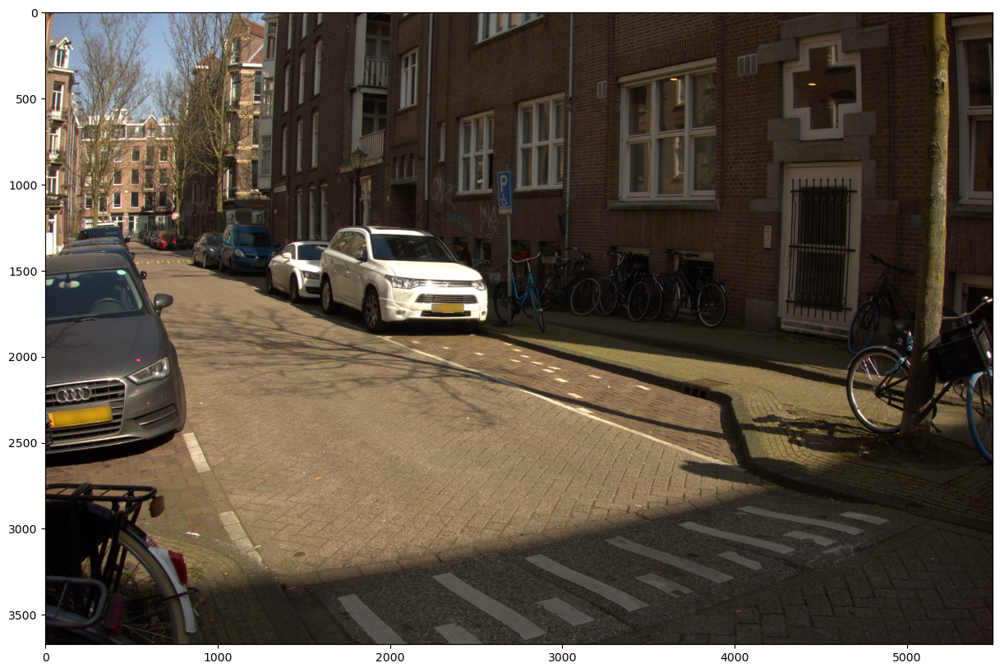

In [269]:
def blur_license_plate_polygon(img, box):
    if type(img) is not Image.Image:
        img = Image.fromarray(img)

    width, height, c = np.array(img).shape
    blur_image = img.filter(ImageFilter.GaussianBlur(radius=25))

    poly_verts = [(x[0], x[1]) for x in box.T]
    polygon = [poly_verts[0], poly_verts[1], poly_verts[2], poly_verts[3]]
    poly_path=Path(polygon)

    x, y = np.mgrid[:width, :height]
    coors=np.hstack((y.reshape(-1, 1), x.reshape(-1,1))) # coors.shape is (4000000,2)

    mask = poly_path.contains_points(coors)
    mask = mask.reshape(width, height)
    mask = np.dstack((mask, ) * c)

    return np.where(mask, blur_image, img)


image_id = _data.iloc[6].filename
raw_image = oads.load_image(image_name=image_id)[0]

license_plate = license_plate_annotations_per_image[image_id]
blurred_image = raw_image.copy()

for box, _ in license_plate:
# box, _ = license_plate[0]
    blurred_image = blur_license_plate_polygon(img=blurred_image, box=box)

fig, ax = plt.subplots(1,1, figsize=(20,10))
ax.imshow(blurred_image)
plt.show()

In [40]:
from PIL import Image, ImageFilter

In [271]:
blurred_dir = os.path.join(jpeg_dir, 'blurred')

os.makedirs(blurred_dir, exist_ok=True)

# fig, ax = plt.subplots(10,1, figsize=(10,50))

for i in range(len(_data)):
    # if i >= 10:
    #     break

    image_id = _data.iloc[i].filename
    # print(image_id)
    # img = Image.open(os.path.join(jpeg_dir, f'{f}.JPG'))
    try:
        raw_image = oads.load_image(image_name=image_id)[0]
    except KeyError:
        print(f'Image load error {i}, {image_id}')
        continue

    try:
        face_annotations = face_annotations_per_image[image_id]
    except KeyError:
        face_annotations = None
        # print(f'Face annotation load error {i}, {image_id}')
    

    try:
        license_plate = license_plate_annotations_per_image[image_id]
    except KeyError:
        license_plate = None
        # print(f'License plate annotation load error {i}, {image_id}')
    
    blurred_image = raw_image.copy()

    # Blur faces
    if face_annotations is not None:
        for coordinates, _ in face_annotations:
            top, right, bottom, left = coordinates
            tr = (right, top)
            tl = (left, top)
            br = (right, bottom)
            bl = (left, bottom)

            # Blur
            box = (left, top, right, bottom)
            crop_img = blurred_image.crop(box)
            # Use GaussianBlur directly to blur the image 10 times. 
            blur_image = crop_img.filter(ImageFilter.GaussianBlur(radius=25))
            blurred_image.paste(blur_image, box)

    if license_plate is not None:
        for box, filename in license_plate:
            # img, corners = draw_losangle(I=img,pts=box,color=(255,0,0),thickness=10)
            # print(box)
            blurred_image = blur_license_plate_polygon(img=blurred_image, box=box)


    # ax[i].imshow(blurred_image)

    Image.fromarray(np.array(blurred_image)).save(os.path.join(blurred_dir, f'{image_id}_blurred.JPG'))

Image load error 7, 00222ac8c0f0f6d4
Image load error 26, 02e2f27868e2f39f
Image load error 41, 061c98c56ceddc98
Image load error 104, 1236d6c7c5e620f4
Image load error 108, 13140c1c1c9c9826
Image load error 120, 1656c6c747078766
Image load error 189, 2432523221080280
Image load error 192, 2468646990592432
Image load error 203, 262c2c6c4c443098
Image load error 218, 27e5e5b592e0f0f0
Image load error 252, 2e63c081670f1b92
Image load error 267, 30343436b3d6b6f8
Image load error 286, 323010f0e0f8f470
Image load error 304, 335292121e0c3cc8
Image load error 331, 362a5a54f9f5f0fa
Image load error 335, 3673616662261738
Image load error 342, 3794904cd9a4b14c
Image load error 385, 3c0c12829f80f0f0
Image load error 406, 3e0e46fe66979dce
Image load error 413, 3e5d3f322636d998
Image load error 414, 3e6ecc8630f8f2e2
Image load error 521, 58588c298ffa2200
Image load error 522, 5858e49895999bc2
Image load error 530, 596d22c8dc2c9013
Image load error 551, 5e5e5c565448c0f8
Image load error 578, 617939b